# Проект: классификация

In [121]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import squarify
from  sklearn.ensemble import IsolationForest
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing  import LabelEncoder
from sklearn import linear_model 
from sklearn import tree 
from sklearn import ensemble 
from sklearn import metrics 
from sklearn import preprocessing 
from sklearn.model_selection import train_test_split 
from sklearn.feature_selection import SelectKBest, f_classif

In [97]:
sns.set_style('whitegrid')

## Часть 1. Знакомство с данными, обработка пропусков и выбросов

Данные о клиентах банка:

* age (возраст);
* job (сфера занятости);
* marital (семейное положение);
* education (уровень образования);
* default (имеется ли просроченный кредит);
* housing (имеется ли кредит на жильё);
* loan (имеется ли кредит на личные нужды);
* balance (баланс).

Данные, связанные с последним контактом в контексте текущей маркетинговой кампании:

* contact (тип контакта с клиентом);
* month (месяц, в котором был последний контакт);
* day (день, в который был последний контакт);
* duration (продолжительность контакта в секундах).

Прочие признаки:

* campaign (количество контактов с этим клиентом в течение текущей кампании);
* pdays (количество пропущенных дней с момента последней маркетинговой кампании до контакта в текущей кампании);
* previous (количество контактов до текущей кампании)
* poutcome (результат прошлой маркетинговой кампании).

И, разумеется, наша целевая переменная deposit, которая определяет, согласится ли клиент открыть депозит в банке. Именно её мы будем пытаться предсказать в данном кейсе.

### Задание 1

In [98]:
#Подгрузим данные 
df = pd.read_csv('bank_fin.csv', sep = ';')
df.head(5)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,"2 343,00 $",yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,"45,00 $",no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,"1 270,00 $",yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,"2 476,00 $",yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,"184,00 $",no,no,unknown,5,may,673,2,-1,0,unknown,yes


In [99]:
# исследуйте данные на предмет пропусков. Где есть пропущенные значения? Сколько их?
# ваш код
df.isnull().sum()

age           0
job           0
marital       0
education     0
default       0
balance      25
housing       0
loan          0
contact       0
day           0
month         0
duration      0
campaign      0
pdays         0
previous      0
poutcome      0
deposit       0
dtype: int64

***Видим пропущенные значения только признаке 'balance' в количестве 25***

### Задание 2

In [100]:
# есть ли в признаке job пропущенные значения? Возможно, они обозначены каким-то специальным словом?
# ваш код
df['job'].unique()

array(['admin.', 'technician', 'services', 'management', 'retired',
       'blue-collar', 'unemployed', 'entrepreneur', 'housemaid',
       'unknown', 'self-employed', 'student'], dtype=object)

***Можно заметить, что специальном словом unknown обозначены пропущенные значения***

### Задание 3

In [101]:
# преобразуйте признак balance таким образом, чтобы он корректно считывался, как вещественное число (float)
df['balance'] = df['balance'].apply(lambda x:  x.replace('$','').replace(',','.').replace(' ','').strip() if x is not np.nan else x)
df['balance'] = df['balance'].astype(float)

In [102]:
#Среднее арифметическое в признаке 'balance'
round(df['balance'].mean(),3)

1529.129

### Задание 4

In [103]:
# обработайте пропуски в признаки balance , заменив их на медианные значения по данному признаку
# ваш код
df['balance'] = df['balance'].fillna(df['balance'].median())

In [104]:
round(df['balance'].mean(),3)

1526.936

### Задание 5

In [105]:
# обработайте пропуски в категориальных признаках: job и education, заменив их на модальные значения
# ваш код
df['job'] = df['job'].replace('unknown',df['job'].mode()[0])
df['education'] = df['education'].replace('unknown',df['education'].mode()[0])

In [106]:
#Среднее армфметическое в признаке balance для самых часто встречающихся значений в признаках работа и образование
round(df[(df['job'] == df['job'].mode()[0]) & (df['education']==df['education'].mode()[0])]['balance'].mean(),3) 

1598.883

### Задание 6

In [107]:
df['balance'].describe()

count    11162.000000
mean      1526.936033
std       3224.829691
min      -6847.000000
25%        123.000000
50%        550.000000
75%       1699.000000
max      81204.000000
Name: balance, dtype: float64

In [108]:
# удалите все выбросы для признака balance
# ваш код
quartile_1, quartile_3 = df['balance'].quantile(0.25), df['balance'].quantile(0.75),
iqr = quartile_3 - quartile_1
lower_bound = quartile_1 - (iqr * 1.5)
upper_bound = quartile_3 + (iqr * 1.5)
outliers = df[(df['balance'] <= lower_bound) | (df['balance'] >= upper_bound)]
df = df[(df['balance'] >= lower_bound) & (df['balance'] <= upper_bound)]
print(f'Число выбросов по методу Тьюки: {outliers.shape[0]}')
print(f'Результирующее число записей: {df .shape[0]}')
print(f'Нижняя граница поиска выбросов по методу Тьюки: {lower_bound}')
print(f'Верхняя граница поиска выбросов по методу Тьюки: {upper_bound}')

Число выбросов по методу Тьюки: 1058
Результирующее число записей: 10105
Нижняя граница поиска выбросов по методу Тьюки: -2241.0
Верхняя граница поиска выбросов по методу Тьюки: 4063.0


## Часть 2:  Разведывательный анализ

### Задание 1

In [109]:
# изучите соотношение классов в ваших данных на предмет несбалансированности, проиллюстрируйте результат
# ваш код
df['deposit'].value_counts()

deposit
no     5424
yes    4681
Name: count, dtype: int64

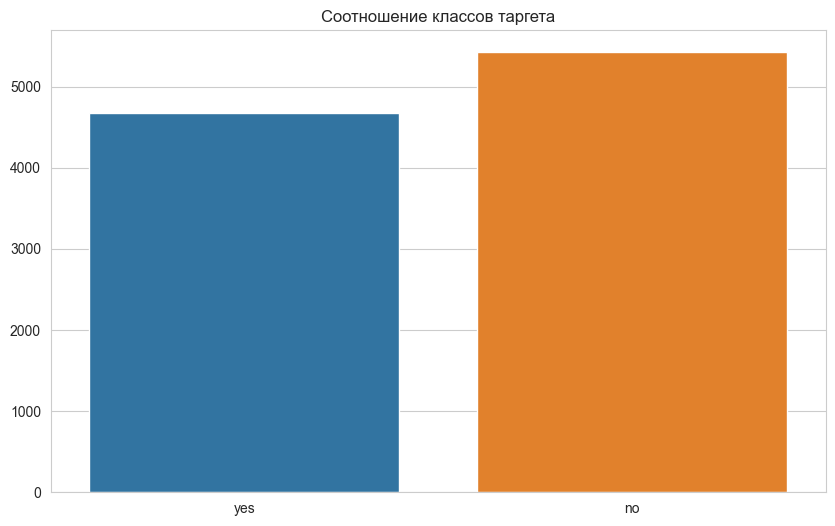

In [110]:
#Проверим сбалансированность классов целевой переменной
plt.figure(figsize=(10,6))
countplot = sns.countplot(data=df,x='deposit')
countplot.set(title='Соотношение классов таргета')
countplot.set_ylabel('')
countplot.set_xlabel('')
plt.show()


Классы относительно сбалансированы

### Задания 2 и 3

In [111]:
#рассчитайте описательные статистики для количественных переменных, проинтерпретируйте результат
#ваш код
df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,10105.000000,10105.000000,10105.000000,10105.000000,10105.000000,10105.000000,10105.000000
mean,40.895497,807.653538,15.590302,368.742603,2.517170,51.319644,0.816230
std,11.734931,994.151966,8.441510,346.651524,2.707159,109.644179,2.243795
min,18.000000,-2049.000000,1.000000,2.000000,1.000000,-1.000000,0.000000
25%,32.000000,95.000000,8.000000,137.000000,1.000000,-1.000000,0.000000
50%,38.000000,445.000000,15.000000,252.000000,2.000000,-1.000000,0.000000
75%,48.000000,1227.000000,22.000000,490.000000,3.000000,2.000000,1.000000
max,95.000000,4063.000000,31.000000,3881.000000,43.000000,854.000000,58.000000


***Подробно разобрать можно, изучив каждый признак отдельно***

#### Анализ возраста клиента ####

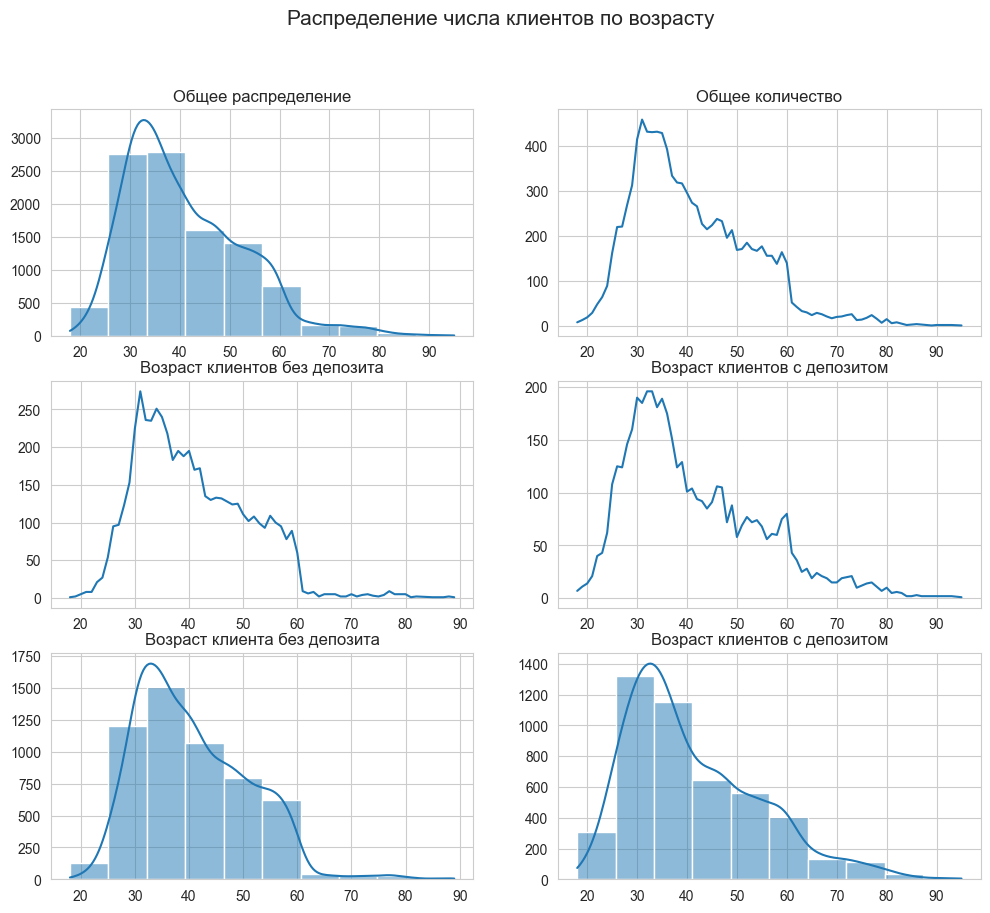

In [112]:
fig,axes = plt.subplots(nrows=3,ncols=2,figsize=(12,10))

#Построим гистограммы и линейные графики связи возратста и депозита в общем и поотдельности по классам
fig.suptitle('Распределение числа клиентов по возрасту',fontsize=15)
sns.histplot(df['age'], bins=10, kde=True,ax=axes[0][0])
axes[0][0].set_xlabel('')
axes[0][0].set_ylabel('')
axes[0][0].set_title('Общее распределение')

age_data = df.groupby('age')['job'].count().reset_index()
sns.lineplot(data=age_data,x='age',y='job',ax=axes[0][1])
axes[0][1].set_xlabel('')
axes[0][1].set_ylabel('')
axes[0][1].set_title('Общее количество')

data1 = df[df['deposit'] == 'no'].groupby('age')['job'].count().reset_index()
data2 = df[df['deposit'] == 'yes'].groupby('age')['job'].count().reset_index()

sns.lineplot(data=data1,x='age',y='job',ax=axes[1][0])
axes[1][0].set_xlabel('')
axes[1][0].set_ylabel('')
axes[1][0].set_title('Возраст клиентов без депозита')

sns.lineplot(data=data2,x='age',y='job',ax=axes[1][1])
axes[1][1].set_xlabel('')
axes[1][1].set_ylabel('')
axes[1][1].set_title('Возраст клиентов с депозитом')

sns.histplot(data=df[df['deposit']=='no'],x='age',bins=10,kde=True,ax=axes[2][0])
axes[2][0].set_xlabel('')
axes[2][0].set_ylabel('')
axes[2][0].set_title('Возраст клиента без депозита')

sns.histplot(data=df[df['deposit']=='yes'],x='age',bins=10,kde=True,ax=axes[2][1])
axes[2][1].set_xlabel('')
axes[2][1].set_ylabel('')
axes[2][1].set_title('Возраст клиентов с депозитом')

plt.show()

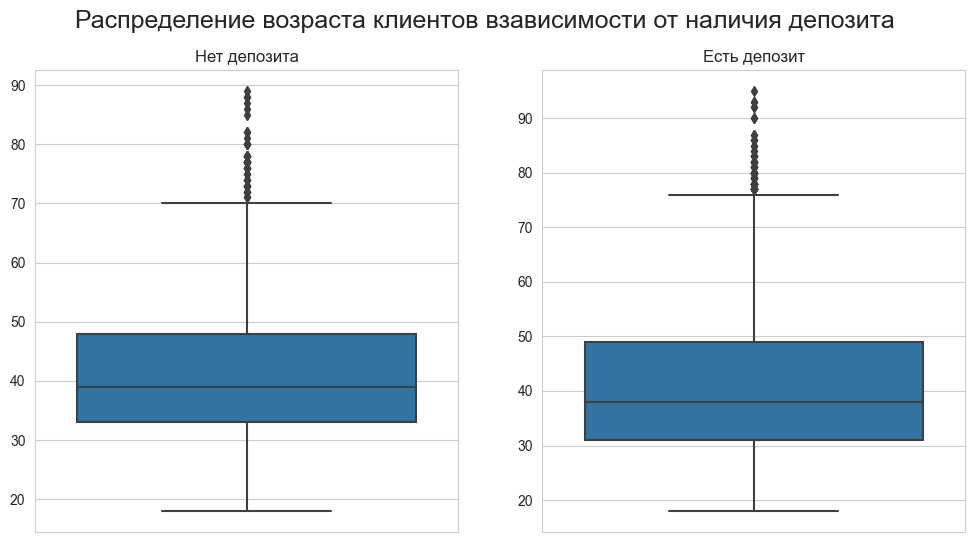

In [113]:
fig, axes = plt.subplots(nrows=1,ncols=2,figsize=(12,6))

#Построим ящики с усами, показывающие разницу в возрасте между теми у кого есть депозит и у кого его нет
plt.suptitle('Распределение возраста клиентов взависимости от наличия депозита',fontsize=18)
sns.boxplot(data=df[df['deposit']=='no'],y='age',ax=axes[0])
axes[0].set_xlabel('')
axes[0].set_ylabel('')
axes[0].set_title('Нет депозита')

sns.boxplot(data=df[df['deposit']=='yes'],y='age',ax=axes[1])
axes[1].set_xlabel('')
axes[1].set_ylabel('')
axes[1].set_title('Есть депозит')
plt.show()


***Миимальный возраст клиентов - 18 лет,средний возраст клиента в районе 40 лет, основная масса клиентов имеют возраст 30-50 лет, макимальный возраст клиента - 95 лет. Связь между возрастом и наличием депозита не прослеживается.***

#### Анализ месяцев

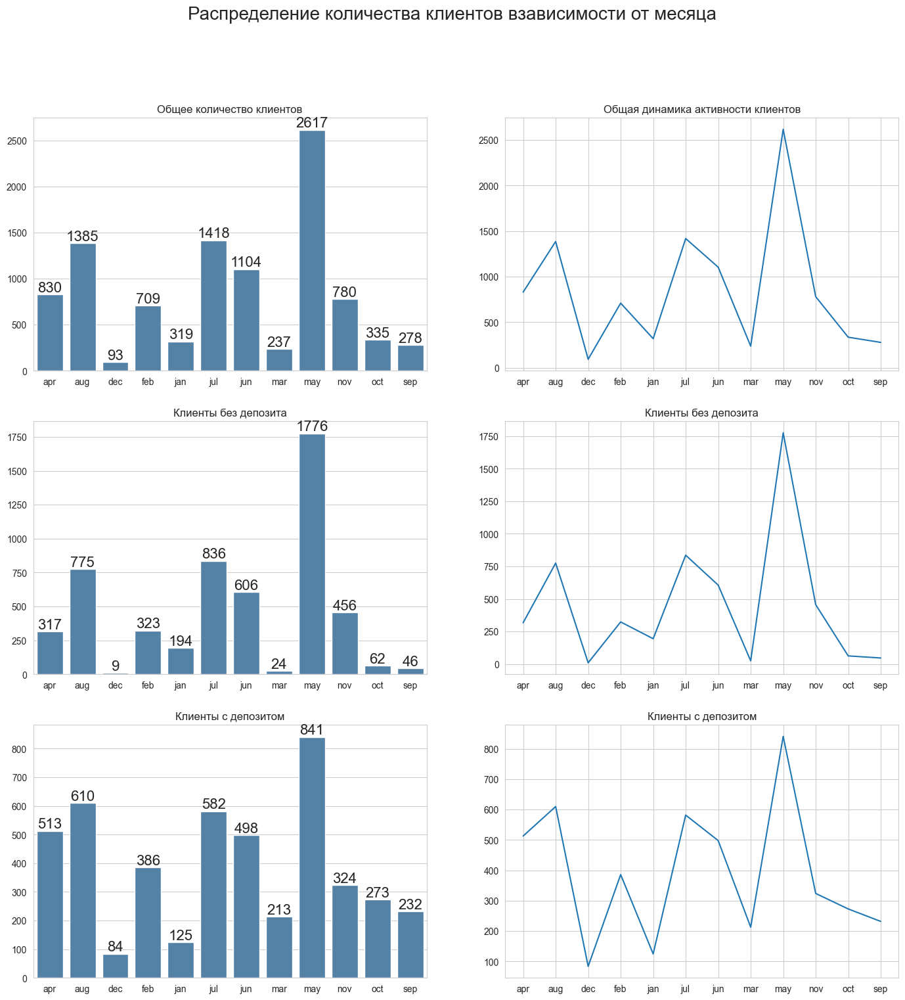

In [114]:
#Построим графики показывающие связь между месяцам последнего звонка и депозитом
month = df.groupby('month')['job'].count().reset_index().sort_values(by='month')
month_no = df[df['deposit']=='no'].groupby('month')['job'].count().reset_index().sort_values(by='month')
month_yes = df[df['deposit']=='yes'].groupby('month')['job'].count().reset_index().sort_values(by='month')
fig,axes = plt.subplots(nrows=3,ncols=2,figsize=(17,17))
fig.suptitle('Распределение количества клиентов взависимости от месяца',fontsize=20)
sns.barplot(data=month,x='month',y='job',ax=axes[0][0],color='steelblue')
for p in axes[0][0].patches:
    axes[0][0].annotate(
        '{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
    ha='center', va='bottom', fontsize=16)
axes[0][0].set(xlabel='')
axes[0][0].set(ylabel='')
axes[0][0].set(title='Общее количество клиентов')

sns.lineplot(data=month,x='month',y='job',ax=axes[0][1])
axes[0][1].set(xlabel='')
axes[0][1].set(ylabel='')
axes[0][1].set(title='Общая динамика активности клиентов')

sns.barplot(data=month_no,x='month',y='job',ax=axes[1][0],color='steelblue')
for p in axes[1][0].patches:
    axes[1][0].annotate(
        '{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
    ha='center', va='bottom', fontsize=16)
axes[1][0].set(xlabel='')
axes[1][0].set(ylabel='')
axes[1][0].set(title='Клиенты без депозита')

sns.lineplot(data=month_no,x='month',y='job',ax=axes[1][1])
axes[1][1].set(xlabel='')
axes[1][1].set(ylabel='')
axes[1][1].set(title='Клиенты без депозита')

sns.barplot(data=month_yes,x='month',y='job',ax=axes[2][0],color='steelblue')
for p in axes[2][0].patches:
    axes[2][0].annotate(
        '{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
    ha='center', va='bottom', fontsize=16)
axes[2][0].set(xlabel='')
axes[2][0].set(ylabel='')
axes[2][0].set(title='Клиенты с депозитом')

sns.lineplot(data=month_yes,x='month',y='job',ax=axes[2][1])
axes[2][1].set(xlabel='')
axes[2][1].set(ylabel='')
axes[2][1].set(title='Клиенты с депозитом')
plt.show()

***При помощи визуализации можно заметить, что пик активности клиентов приходиться на май (преимущественно),июнь, июль. август. Клиенты, имеющие депозит клиенты проявляют гораздо большую активность во все месяца, но в особенности в октябре, сентябре, марте, декабре***

#### Анализ дней недели

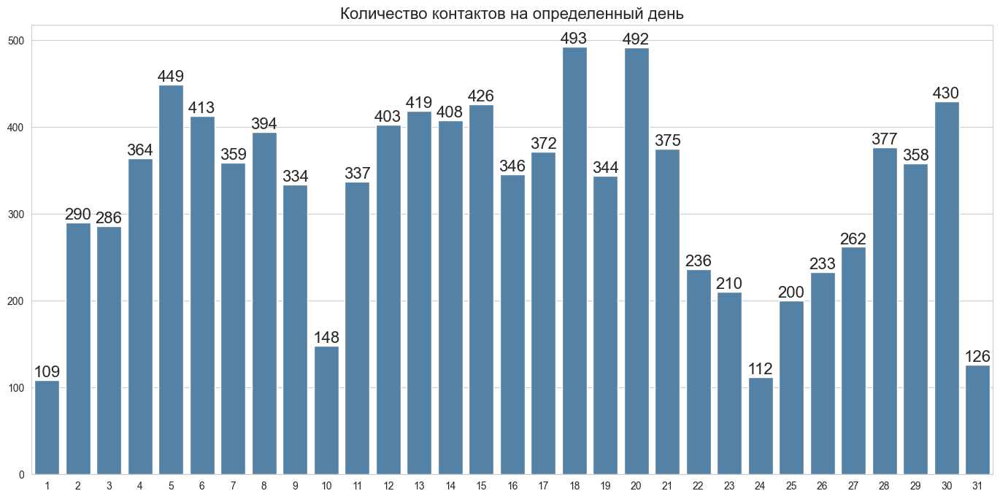

In [115]:
#Посмтроим столбчатые диаграммы, иллюстрирующие количество между днем последнего контакта и активности клиентов
day = df.groupby('day')['deposit'].count().reset_index()
fig,ax = plt.subplots(figsize=(17,8))
sns.barplot(data=day,x='day',y='deposit',color='steelblue')
for p in ax.patches:
    ax.annotate(
        '{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
    ha='center', va='bottom', fontsize=16)
plt.xlabel('')
plt.ylabel('')
plt.title('Количество контактов на определенный день',fontsize=16)
plt.show()


***Наибольшее число контактов 5,18,20,30 числах, наименьшее количество контактов 1,10,24,31 числах***

#### Продолжительность контакта

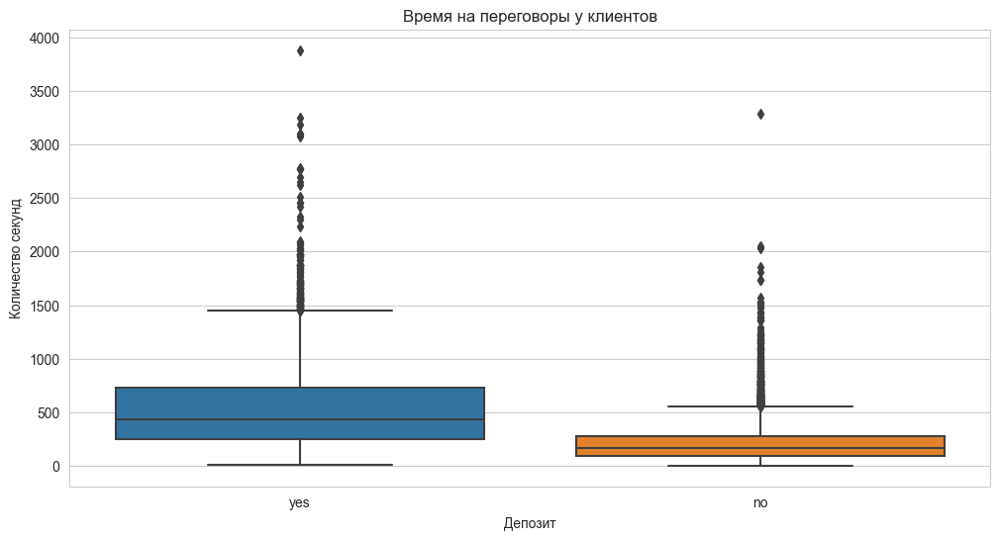

In [116]:
#Ящик с усами, иллюстрирующий связь между продолжительностью контакта и оформлением депозита
plt.figure(figsize=(12,6))
sns.boxplot(df,x='deposit',y='duration')
plt.xlabel('Депозит')
plt.ylabel('Количество секунд')
plt.title('Время на переговоры у клиентов')
plt.show()

***Время затраченное на переговоры у тех кто приобрел депозит значиьтельно больше***

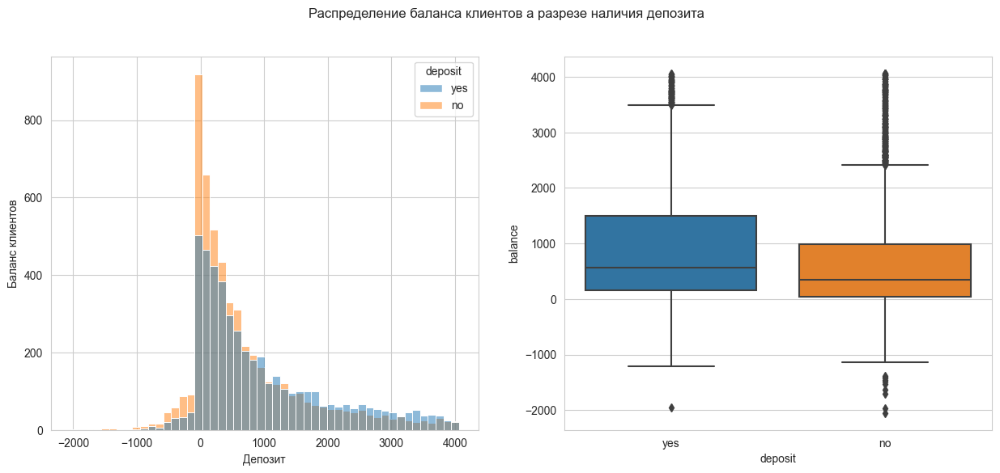

In [117]:
#Графики показывающие связь между балансом и депозитом
fig,axes = plt.subplots(nrows=1,ncols=2,figsize=(15,6))
fig.suptitle('Распределение баланса клиентов а разрезе наличия депозита')
sns.histplot(data = df, x='balance',bins=50,hue='deposit',ax=axes[0])
axes[0].set_xlabel('Баланс')
axes[0].set_ylabel('Количество клиентов')
sns.boxplot(data=df,x='deposit',y='balance')
axes[0].set_xlabel('Депозит')
axes[0].set_ylabel('Баланс клиентов')
plt.show()

***Баланс у тех, кто открыл депозит выше. Как правило те, у кого нет депозита держатели баланса до 1000 долларов либо и вовсе отрицательного баланса. Т.е. оформляют в основном активные клиенты банка***

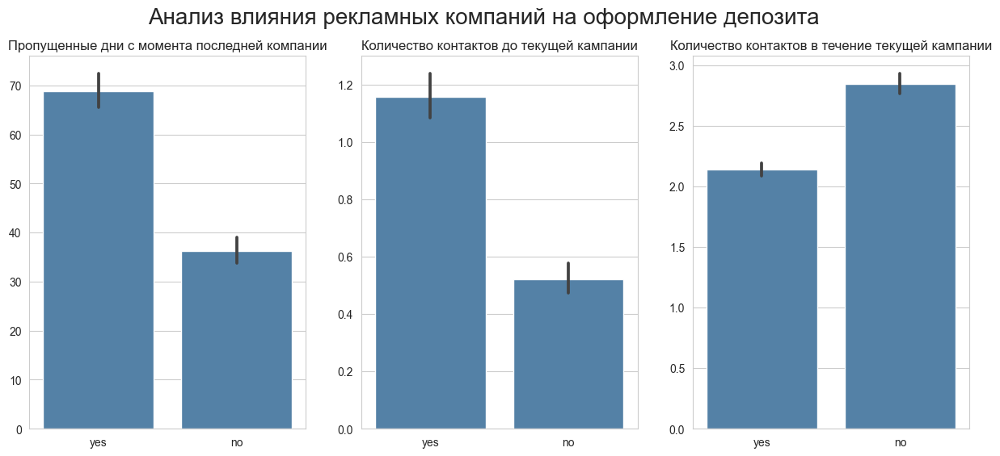

In [118]:
fig,axes = plt.subplots(nrows=1,ncols=3,figsize=(15,6))
fig.suptitle('Анализ влияния рекламных компаний на оформление депозита',fontsize=20)
sns.barplot(data=df,x='deposit',y='pdays',color='steelblue',ax=axes[0])
axes[0].set_xlabel('')
axes[0].set_ylabel('')
axes[0].set_title('Пропущенные дни с момента последней компании')

sns.barplot(data=df,x='deposit',y='previous',color='steelblue',ax=axes[1])
axes[1].set_xlabel('')
axes[1].set_ylabel('')
axes[1].set_title('Количество контактов до текущей кампании')
sns.barplot(data=df,x='deposit',y='campaign',color='steelblue',ax=axes[2])
axes[2].set_xlabel('')
axes[2].set_ylabel('')
axes[2].set_title('Количество контактов в течение текущей кампании')
plt.show()

***Количество пропущенных дней для клиентов с депозитом больше чем у клиентов без депозита, количество контактов до текущей рекламной компании больше для клиентов, кто оформил депозит. При этом, количество контактов с клиентами не оформившими депозит больше при текущей рекламной компании*** 

### Задания 4 и 5

In [119]:
#Для корректности заменим бинарный признак на 1,0 в целевом признаке
df['deposit'] = df['deposit'].apply(lambda x: 1 if x=='yes' else 0)
df['deposit']

0        1
1        1
2        1
3        1
4        1
        ..
11157    0
11158    0
11159    0
11160    0
11161    0
Name: deposit, Length: 10105, dtype: int64

In [120]:
#рассчитайте описательные статистики для категориальных переменных, проинтерпретируйте результат
#ваш код
#постройте визуализации, иллюстрирующие результаты
df.describe(include='object')

,job,marital,education,default,housing,loan,contact,month,poutcome
count,10105,10105,10105,10105,10105,10105,10105,10105,10105
unique,11,3,3,2,2,2,3,12,4
top,management,married,secondary,no,no,no,cellular,may,unknown
freq,2315,5715,5517,9939,5243,8712,7283,2617,7570


***Визуализируем каждый признак по отдельности***

#### Анализ рода деятельности 

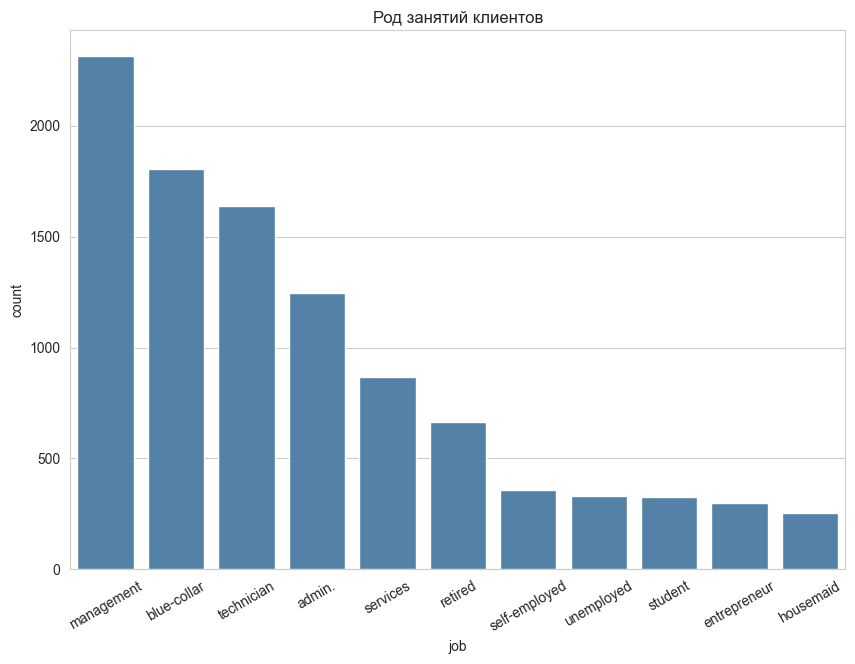

In [26]:
#Построим столбчатую диаграмму по сферам занятости клиентов
data = df['job'].value_counts().reset_index()
plt.figure(figsize=(10,7))
sns.barplot(data=data,x='job',y='count',color='steelblue')
plt.title('Род занятий клиентов')
plt.xticks(rotation=30)
plt.show()


***Большинство клиентов заняты в сфере мэнеджмента, чуть уступают по количеству синие воротнички и технические работники***

#### Анализ семейного положения

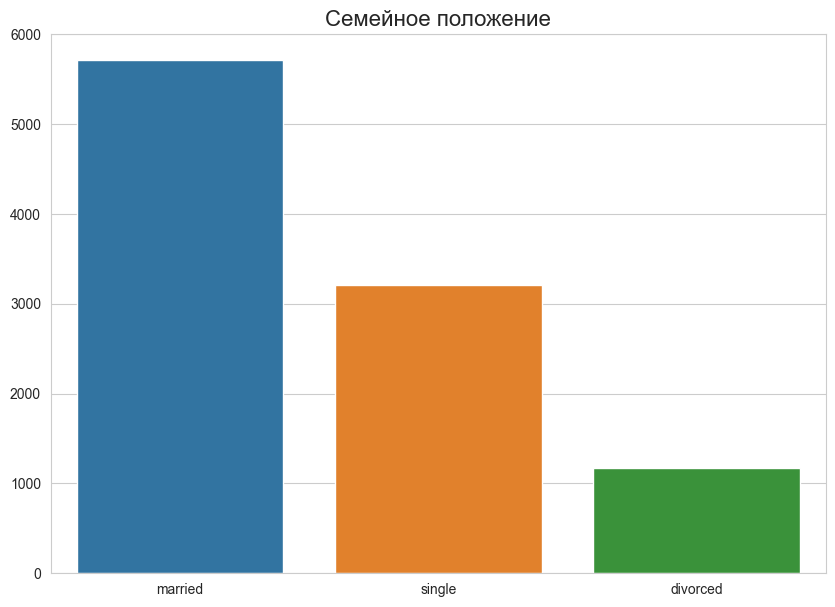

In [27]:
#Диаграмма распределения семейного положения клиентов
data = df['marital'].value_counts().reset_index()
plt.figure(figsize=(10,7))
sns.barplot(data=data,x='marital',y='count')
plt.xlabel('')
plt.ylabel('')
plt.title('Семейное положение',fontsize=16)
plt.show()

***Большая часть клиентов являются женатыми людьми, далее идут холостые и разведенные***

#### Анализ образования

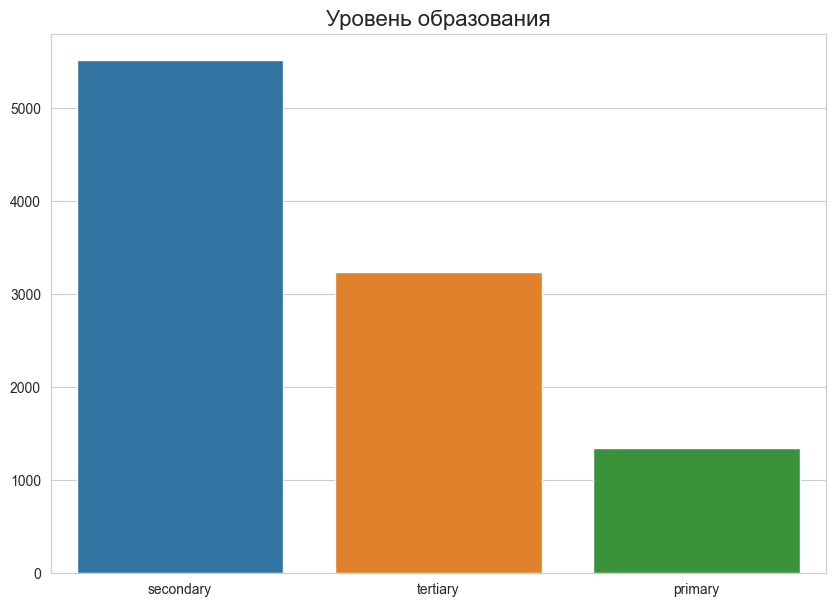

In [28]:
#диаграмма распределения образвания
data = df['education'].value_counts().reset_index()
plt.figure(figsize=(10,7))
sns.barplot(data=data,x='education',y='count')
plt.xlabel('')
plt.ylabel('')
plt.title('Уровень образования',fontsize=16)
plt.show()

***Большая часть клиетов имеют среднее образование, далее идут высшее образование и начальное образование***

#### Имеется ли просроченная задолженность

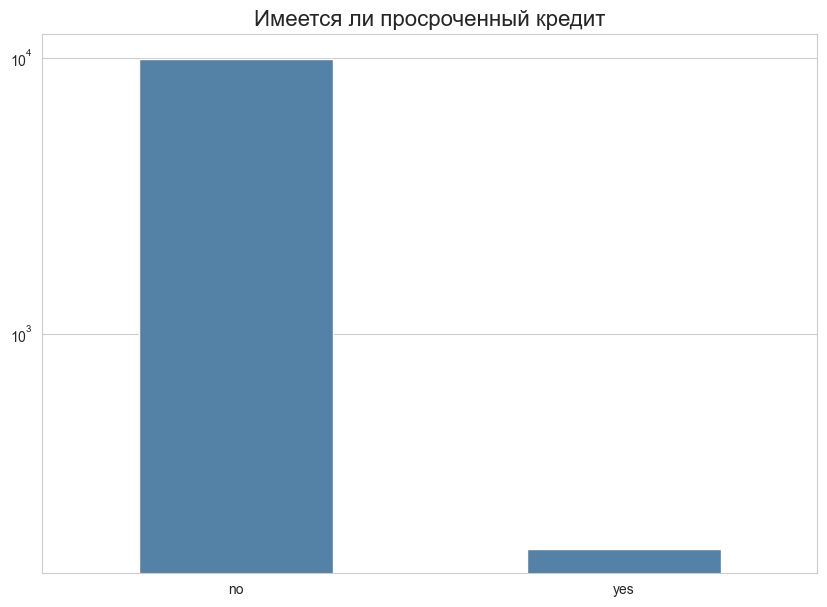

In [29]:
#Диаграмма распределения просрочененой задолженности
data = df['default'].value_counts().reset_index()
plt.figure(figsize=(10,7))
sns.barplot(data=data,x='default',y='count',color='steelblue',width=0.5)
plt.xlabel('')
plt.ylabel('')
plt.title('Имеется ли просроченный кредит',fontsize=16)
plt.yscale('log')
plt.show()

***Практически никто не имеет просроченной задолженности***

#### Bмеется ли кредит на жильё

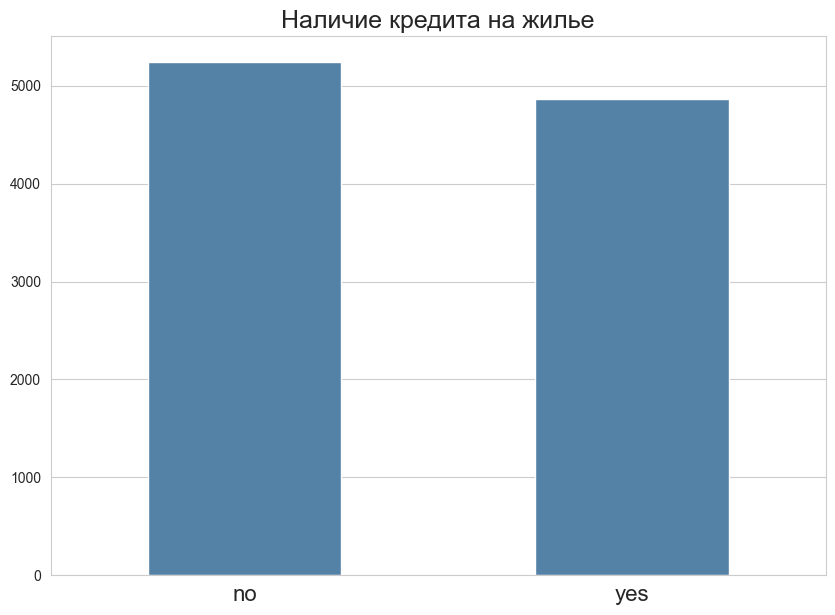

In [30]:
#диаграмма распреления кридита на жилье
plt.figure(figsize=(10,7))
data=df.groupby('housing').size().reset_index(name='counts')
sns.barplot(x=data['housing'],y=data['counts'],color='steelblue',width=0.5)
plt.xticks(fontsize=16)
plt.xlabel('')
plt.ylabel('')
plt.title('Наличие кредита на жилье',fontsize=18)
plt.show()

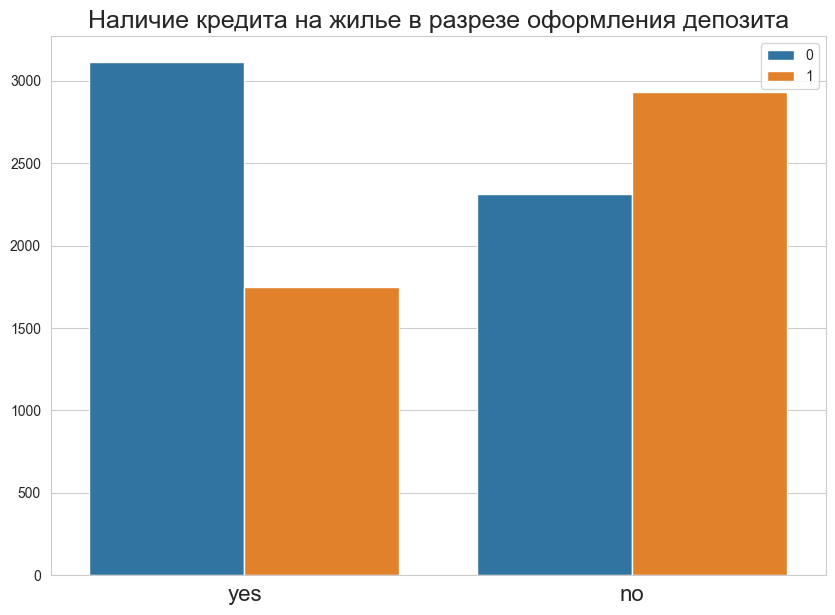

In [31]:
#Оформление депозита и кредит на жилье
plt.figure(figsize=(10,7))
sns.countplot(data=df,x='housing',hue='deposit')
plt.xticks(fontsize=16)
plt.xlabel('')
plt.ylabel('')
plt.title('Наличие кредита на жилье в разрезе оформления депозита',fontsize=18)
plt.legend(loc=0)
plt.show()

***Судя по графикам соотношение тех у кого есть кредит на жилье и у тех кого нет кредита примерно одинаковое. У тех клиентов, у которых нет обременения кредитом, депозит оформляется чаще***

#### Тип контакта с клиентом

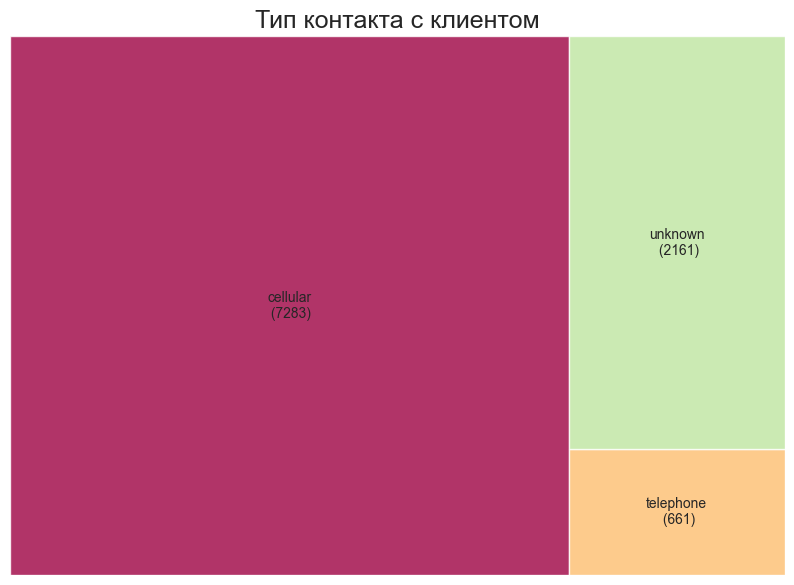

In [122]:
#Диаграмма Treemap,иллюстрирующая количество клиентов по способу связи с ними
data = df.groupby('contact').size().reset_index(name='counts')
labels = data.apply(lambda x: str(x[0]) + "\n (" + str(x[1]) + ")", axis=1)
sizes = data['counts'].values.tolist()
colors = [plt.cm.Spectral(i/float(len(labels))) for i in range(len(labels))]


plt.figure(figsize=(10,7))
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=.8)


plt.title('Тип контакта с клиентом',fontsize=18)
plt.axis('off')
plt.show()

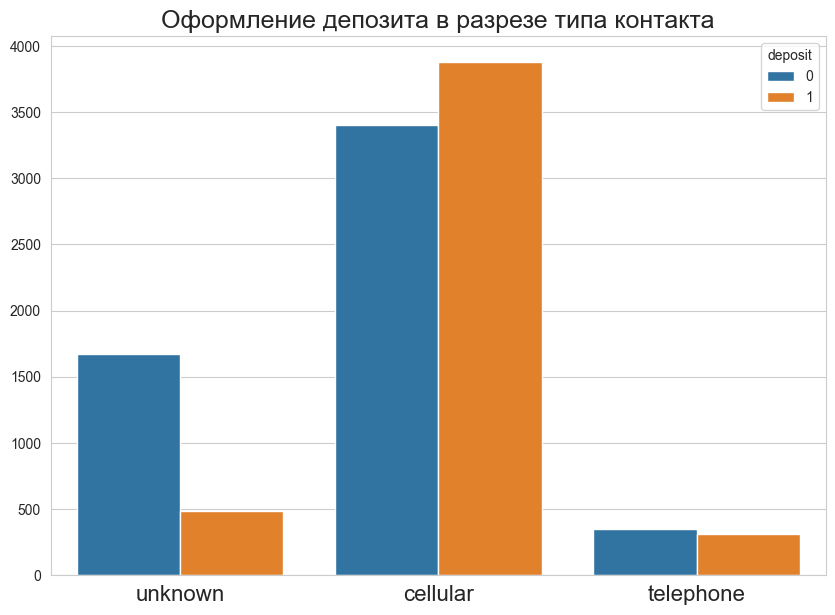

In [33]:
#Посмотрим распределение количества клиентов согласных на депозит по способу связи с ними
plt.figure(figsize=(10,7))
sns.countplot(data=df,x='contact',hue='deposit')
plt.xlabel('')
plt.ylabel('')
plt.xticks(fontsize=16)
plt.title('Оформление депозита в разрезе типа контакта',fontsize=18)
plt.show()

***Судя по графикам, с клиетами связывались преимущественно с помощью сотового телефона (cellular) именно в этой группе чаще всего оформлялись депозиты***

#### Результат прошлой маркетинговой компании

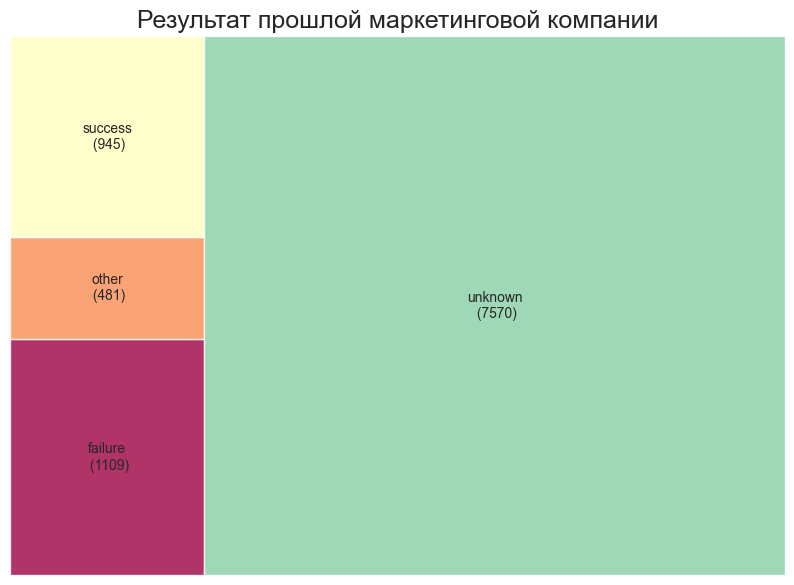

In [123]:
#Диаграмма Treemap по результатам предыдущей маркетинговой компании 
data = df.groupby('poutcome').size().reset_index(name='counts')
labels = data.apply(lambda x: str(x[0]) + "\n (" + str(x[1]) + ")", axis=1)
sizes = data['counts'].values.tolist()
colors = [plt.cm.Spectral(i/float(len(labels))) for i in range(len(labels))]

plt.figure(figsize=(10,7))
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=.8)

plt.title('Результат прошлой маркетинговой компании',fontsize=18)
plt.axis('off')
plt.show()

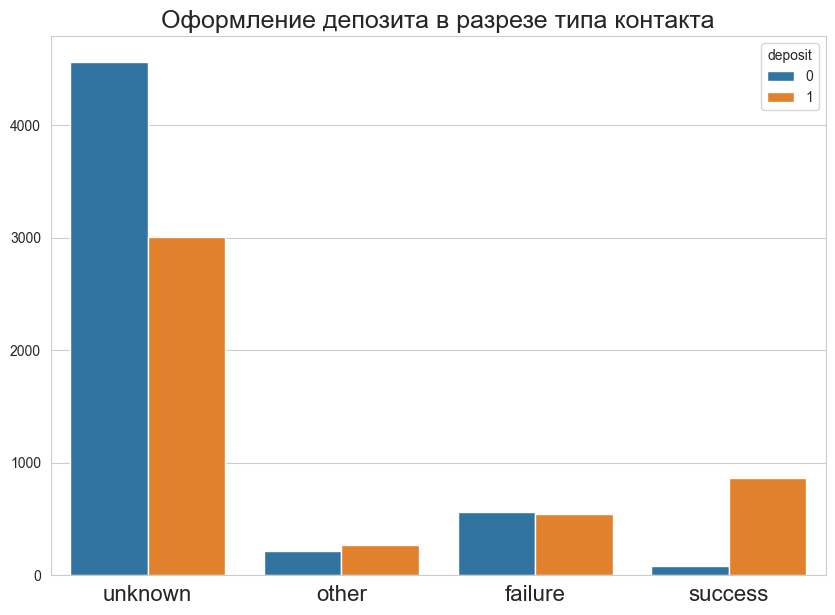

In [124]:
#Связь между открытием депозита и результата предыдущей маркетинговой компании
plt.figure(figsize=(10,7))
sns.countplot(data=df,x='poutcome',hue='deposit')
plt.xlabel('')
plt.ylabel('')
plt.xticks(fontsize=16)
plt.title('Оформление депозита в разрезе типа контакта',fontsize=18)
plt.show()

***Для статуса "success" предыдущей маркетинговой кампании успех в текущей превалирует над количеством неудач. Клиенты, отказавшиеся от открытия депозита в прошлую кампанию, как правило, половина, отказывается открывать депозит и в новую кампанию.***

#### Имеется ли кредит на личные нужды

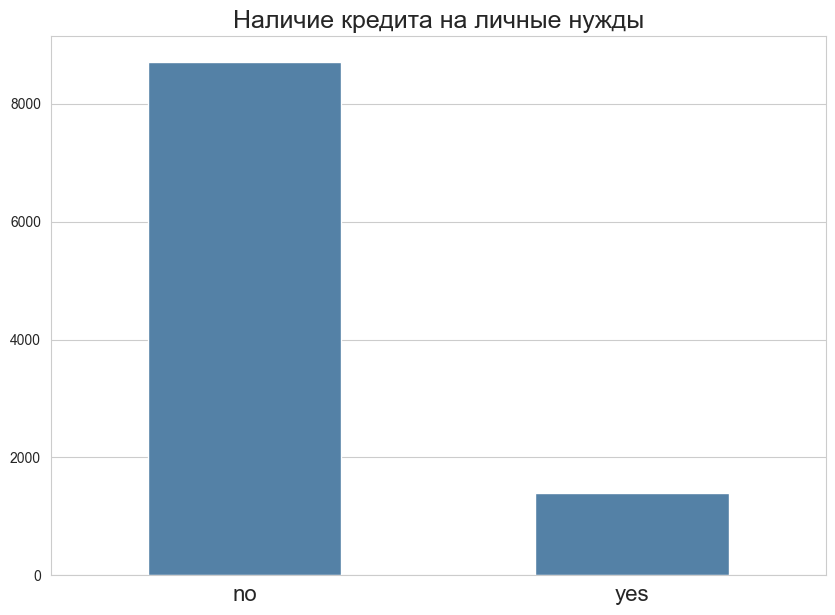

In [36]:
#Диаграмма показывающая наличие кредита на личные нужды
plt.figure(figsize=(10,7))
data=df.groupby('loan').size().reset_index(name='counts')
sns.barplot(x=data['loan'],y=data['counts'],color='steelblue',width=0.5)
plt.xticks(fontsize=16)
plt.xlabel('')
plt.ylabel('')
plt.title('Наличие кредита на личные нужды',fontsize=18)
plt.show()

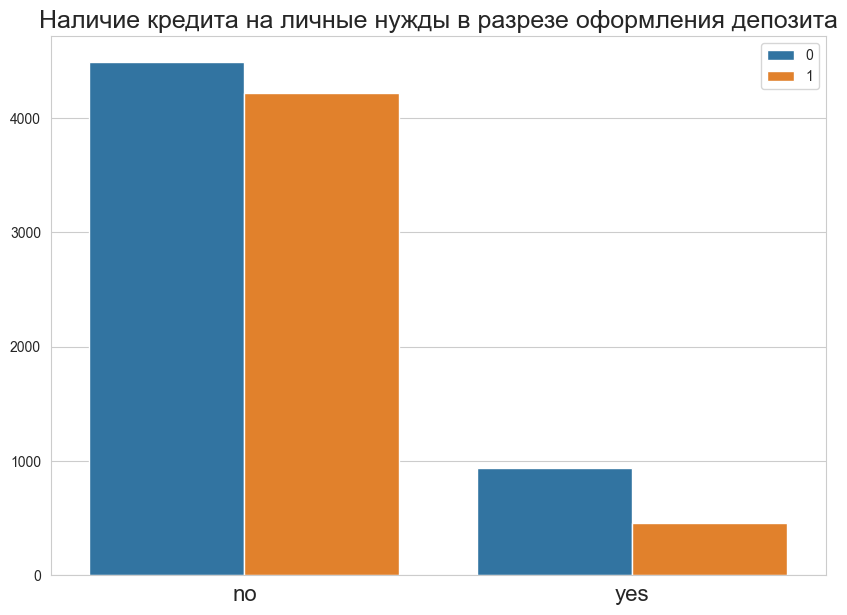

In [125]:
#Связь между открытием депозита и наличия редита на личные нужды
plt.figure(figsize=(10,7))
sns.countplot(data=df,x='loan',hue='deposit')
plt.xticks(fontsize=16)
plt.xlabel('')
plt.ylabel('')
plt.title('Наличие кредита на личные нужды в разрезе оформления депозита',fontsize=18)
plt.legend(loc=0)
plt.show()

***Количество людей, имеющие кредиты на личные нужды сильно меньше тех, кто кредитов на личне нужды не имеет. Соотношение тех, у кого имеется депозит и у тех кто его не оформил у клиентов, кто не имеет кредитов на личные нужды примерно одинаковое. У клиентов, которые имеют кредиты на личные нужды больше тех, кто не оформил депозит*** 

### Задание 6

In [126]:
# Узнайте, для какого статуса предыдущей маркетинговой кампании успех в текущей превалирует над количеством неудач.
# ваш код
df.groupby('poutcome')['deposit'].value_counts()

poutcome  deposit
failure   0           562
          1           547
other     1           265
          0           216
success   1           861
          0            84
unknown   0          4562
          1          3008
Name: count, dtype: int64

***Как уже говоридось ранее при результате success предыдущей маркетинговой компании, чаще открывают депозит***

### Задание 7

In [127]:
# узнайте, в каком месяце чаще всего отказывались от предложения открыть депозит
# ваш код
import calendar
months = list(calendar.month_name)[1:]
months=[item.lower() for item in months]

maximum = 0
month = ""
for item in months:
    if maximum < df[(df['month'] ==item[:3]) & (df['deposit']==0)].shape[0] / df[df['month'] ==item[:3]].shape[0]:
        maximum = df[(df['month'] ==item[:3]) & (df['deposit']==0)].shape[0] / df[df['month'] ==item[:3]].shape[0]
        month = item[:3]
print(f'Чаще всего отказывались от предложения открыть депозит в {month}, процент отказов составляет {int(maximum*100)}%')


Чаще всего отказывались от предложения открыть депозит в may, процент отказов составляет 67%


***Самое большое количество неудач выдолось на май месяц***

### Задание 8

#### Анализ возрастных групп

In [129]:
# создайте возрастные группы и определите, в каких группах более склонны открывать депозит, чем отказываться от предложения
def make_age_group(age):
    if age < 30:
        return '<30'
    elif age in range(30,40):
        return '30-40'
    elif age in range(40,50):
        return '40-50'
    elif age in range(50,60):
        return '50-60'
    elif age >=60:
        return '60+'
#Создадим новый признак - возрастная группа   
df['age_group'] = df['age'].apply(make_age_group)


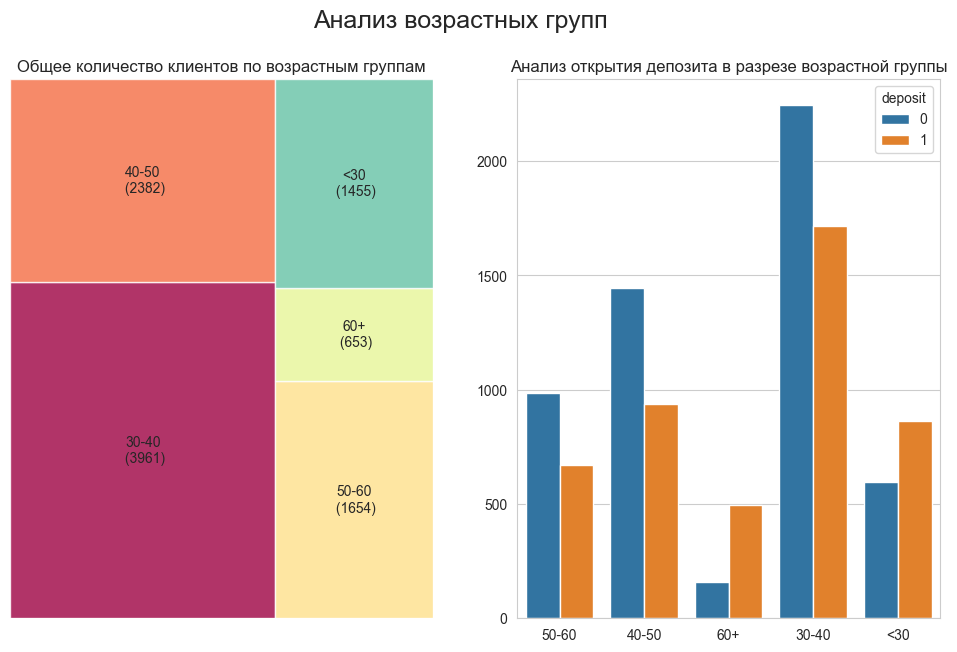

In [130]:
data = df.groupby('age_group').size().reset_index(name='counts')
labels = data.apply(lambda x: str(x[0]) + "\n (" + str(x[1]) + ")", axis=1)
sizes = data['counts'].values.tolist()
colors = [plt.cm.Spectral(i/float(len(labels))) for i in range(len(labels))]

# Draw Plot
fig, axes = plt.subplots(nrows=1,ncols=2,figsize=(12,7))
fig.suptitle('Анализ возрастных групп', fontsize=18)
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=.8,ax=axes[0])
axes[0].axis('off')
axes[0].set_title('Общее количество клиентов по возрастным группам')

sns.countplot(data=df,x='age_group',hue='deposit',ax=axes[1])
axes[1].set_title('Анализ открытия депозита в разрезе возрастной группы')
axes[1].set_ylabel('')
axes[1].set_xlabel('')
plt.show()



***Самой многочисленной возрастной группой является 30-40 лет, в основном во всех группах количество неоткрывших депозит превалирует над оформившими депозит, за исключением групп, в которых клиенты младше 30, а также в которых клиеты старше 60 лет.***

### Задания 9 и 10

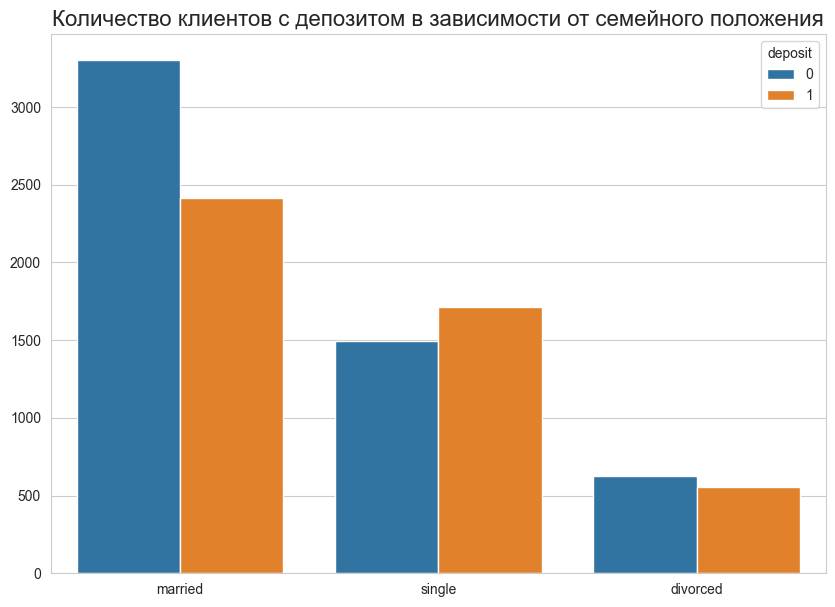

In [42]:
# постройте визуализации для открывших и неоткрывших депозит в зависимости от семейного статуса
plt.figure(figsize=(10,7))
sns.countplot(x = 'marital', hue = 'deposit', data = df)
plt.xlabel('')
plt.ylabel('')
plt.title('Количество клиентов с депозитом в зависимости от семейного положения',fontsize=16)
plt.show()

***По графику видно, что несмотря на подавляющее большинство женатых, у холостых имеется тенденция оформлять депозит, чаще чем от него отказываться*** 

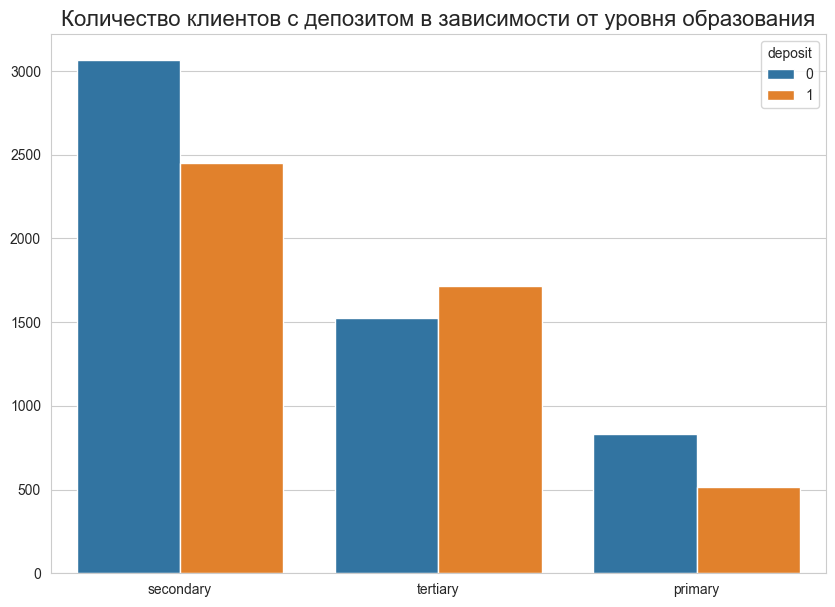

In [43]:
# постройте визуализации для открывших и неоткрывших депозит в зависимости от образования
plt.figure(figsize=(10,7))
sns.countplot(x = 'education', hue = 'deposit', data = df)
plt.xlabel('')
plt.ylabel('')
plt.title('Количество клиентов с депозитом в зависимости от уровня образования',fontsize=16)
plt.show()

***Несмотря на то, что большинство составляют клиенты со среднем образованием, клиенты с высшим образованием оформляют депозит чаще чем от него отказываются***

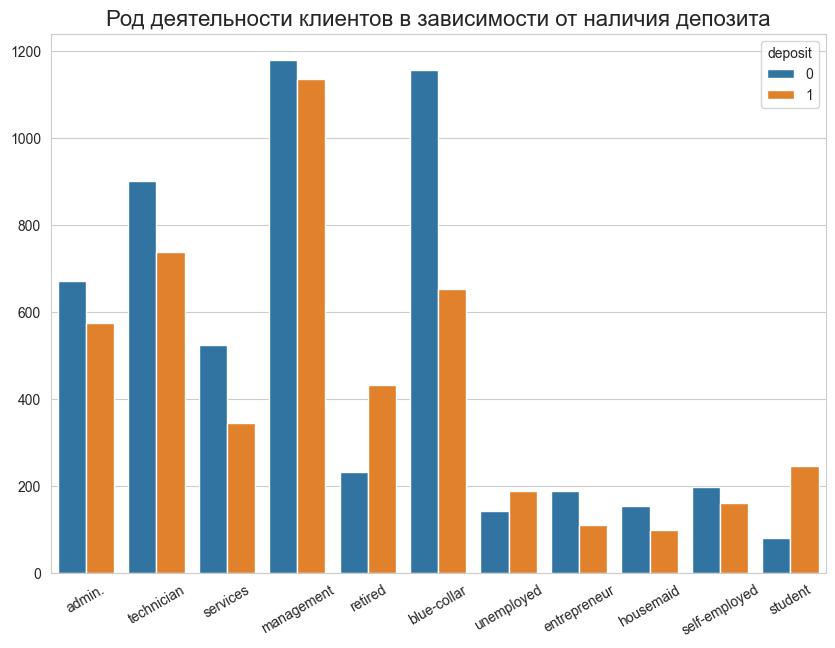

In [131]:
# постройте визуализации для открывших и неоткрывших депозит в зависимости от вида профессиональной занятости
plt.figure(figsize=(10,7))
sns.countplot(x = 'job', hue = 'deposit', data = df)
plt.xlabel('')
plt.ylabel('')
plt.title('Род деятельности клиентов в зависимости от наличия депозита',fontsize=16)
plt.xticks(rotation=30)
plt.show()

***Те, кто в отставке(retired),безработные(unemployed), а также студенты, чаще оформляют депозит, чем от него отказываются***

### Задание 11

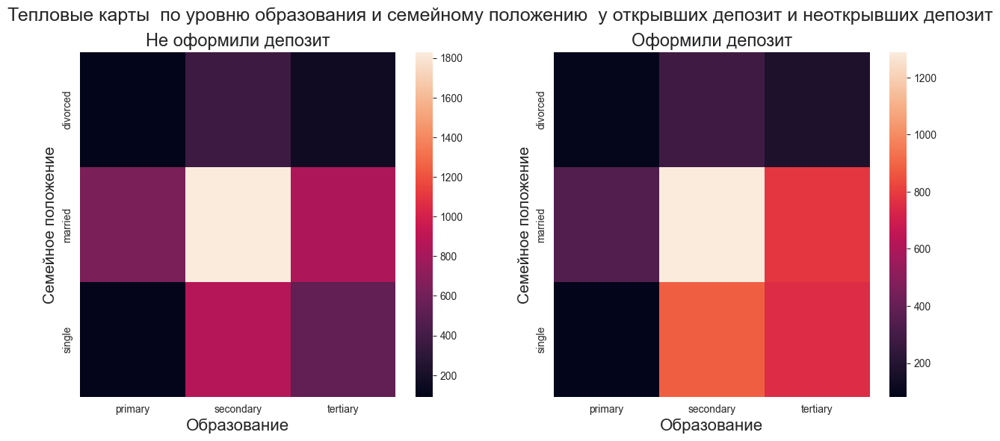

In [45]:
# постройте сводную таблицу, чтобы определить люди с каким образованием и семейным статусом наиболее многочисленны
#(если рассматривать тех, кто о1]
data1 = df[df['deposit']==0]
data2 = df[df['deposit']==1]

pivot1 = pd.pivot_table(data=data1,index=['marital'],columns='education',values='deposit',aggfunc='count')
pivot2 = pd.pivot_table(data=data2,index=['marital'],columns='education',values='deposit',aggfunc='count')

fig,axes = plt.subplots(nrows=1,ncols=2,figsize=(15,6))
fig.suptitle('Тепловые карты  по уровню образования и семейному положению  у открывших депозит и неоткрывших депозит',fontsize=18)
sns.heatmap(pivot1,ax=axes[0])
axes[0].set_xlabel('Образование',fontsize=16)
axes[0].set_ylabel('Семейное положение',fontsize=15)
axes[0].set_title('Не оформили депозит',fontsize=17)

sns.heatmap(pivot2,ax=axes[1])
axes[1].set_xlabel('Образование',fontsize=16)
axes[1].set_ylabel('Семейное положение',fontsize=15)
axes[1].set_title('Оформили депозит',fontsize=17)

plt.show()

***Пересечение в двух категориях является самым многочисленным для клиентов и согласившиеся взять депозит и отказавшихся: с семейные положением married и образованием secondary.Оформляют депозит клиенты. у которых сочетание single-tertiary (Семейное положение холостое - образование высшее) и married=tertiary(женатые-образование высшее)***

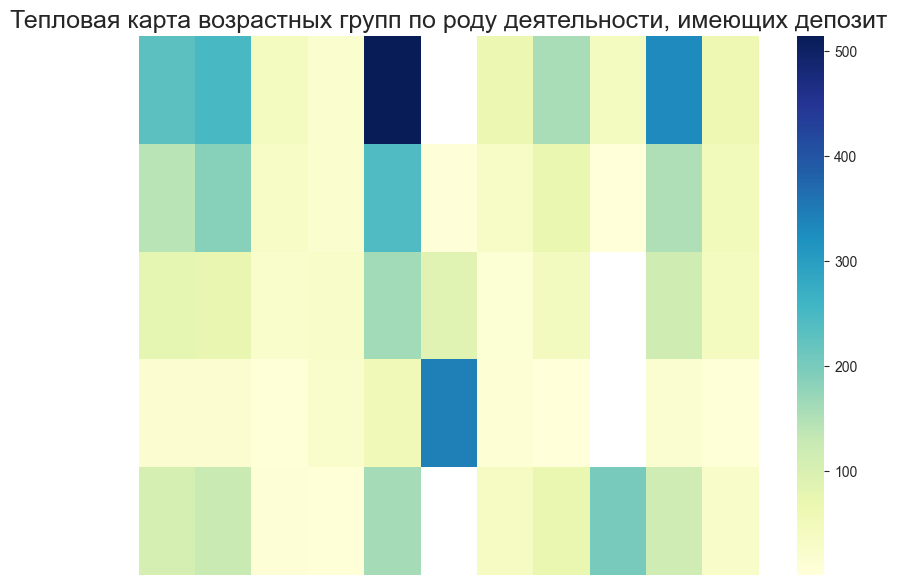

In [46]:
pivot = data2.pivot_table(
    values='deposit',
    columns='job',
    index='age_group',
    aggfunc ='count'
)
plt.figure(figsize=(10,7))
sns.heatmap(data=pivot, cmap='YlGnBu')
plt.title('Тепловая карта возрастных групп по роду деятельности, имеющих депозит',fontsize=18)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.axis('off')
plt.xlabel('')
plt.ylabel('')
plt.show()

***По графику видно, что чаще всего берут депозит клиента возрастной группы 30-40 лет из сферы деятельности - менеджмента,далее идут из той же возрастной группы - техники, а также возрастной группы 60+, находящиеся на пенсии (retired)***

## Часть 3: преобразование данных

### Задание 1

In [48]:
# преобразуйте уровни образования
labelencoder = LabelEncoder()
df['education'] = labelencoder.fit_transform(df['education'])

In [49]:
df['age_group'] = labelencoder.fit_transform(df['age_group'])

### Задания 2 и 3

In [50]:
# преобразуйте бинарные переменные в представление из нулей и единиц
df[['default','loan','housing']] = df[['default','loan','housing']].replace(['no', 'yes'],[0,1])

### Задание 4

In [51]:
# создайте дамми-переменные
df = pd.get_dummies(data=df,columns=['job','marital','contact','poutcome','month'])


### Задания 5 и 6

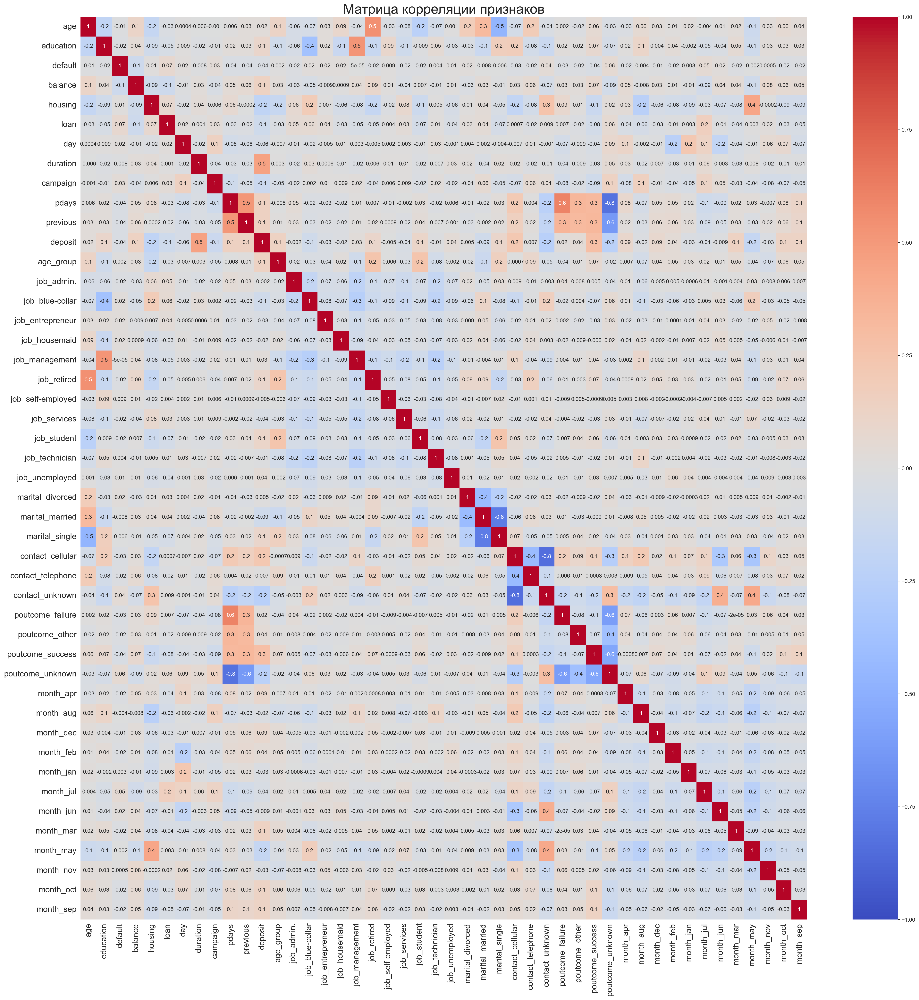

In [53]:
# постройте корреляционную матрицу и оцените данные на предмет наличия мультиколлинеарности
plt.figure(figsize=(30,30),dpi=200)
sns.heatmap(df.corr(),annot = True, vmin=-1, vmax=1, center= 0, cmap= 'coolwarm',fmt='.1g')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Матрица корреляции признаков',fontsize=25)
plt.show()

***Мультиколлинеарности, судя по тепловой карте не наблюдается. В наибольшей степени коррелирующие с целевой переменной признаки: duration (продолжительность разговора), poutcome_success (успешный результат предыдущей маркетинговой компании),contact_cellular (контакт через сотовую связь).***

### Задания 7 и 8

In [54]:
X = df.drop(['deposit'], axis=1)
y = df['deposit']
 
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state = 42, test_size = 0.33)

In [55]:
# рассчитайте необходимые показатели
print(f'Размер тестовой выборки X_train={X_train.shape[0]}, y_train={y_train.shape[0]}')
print(f'Размер тестовой выборки X_test={X_test.shape[0]}, y_test={y_test.shape[0]}')

Размер тестовой выборки X_train=6770, y_train=6770
Размер тестовой выборки X_test=3335, y_test=3335


In [56]:
print(f'Среднее значение целевой переменной на тестовой выборке {round(y_test.mean(),2)}')

Среднее значение целевой переменной на тестовой выборке 0.46


### Задание 9

In [132]:
# с помощью SelectKBest отберите 15 наиболее подходящих признаков
selector = SelectKBest(score_func=f_classif,k=15)
selector.fit(X_train, y_train)
cols = selector.get_feature_names_out()

#Оставим только отобранные признаки
X_train = X_train[cols]
X_test = X_test[cols]

### Задание 10

In [133]:
# нормализуйте данные с помощью minmaxsxaler
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

X_train_scal = scaler.fit_transform(X_train)
X_train_scal = pd.DataFrame(X_train_scal, columns=X_train.columns)
X_test_scal = scaler.transform(X_test)
X_test_scal = pd.DataFrame(X_test_scal, columns=X_test.columns)



# Часть 4: Решение задачи классификации: логистическая регрессия и решающие деревья

### Задание 1

In [134]:
# обучите логистическую регрессию и рассчитайте метрики качества
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression(solver='sag',random_state=42,max_iter=1000)
log_reg.fit(X_train_scal,y_train)
y_test_pred = log_reg.predict(X_test_scal)
y_train_pred = log_reg.predict(X_train_scal)
print(f'Метрики на тестовых даннных\n {metrics.classification_report(y_test, y_test_pred)}')
print(f'Метрики на тренировочных данных\n {metrics.classification_report(y_train, y_train_pred)}')

Метрики на тестовых даннных
               precision    recall  f1-score   support

           0       0.79      0.87      0.83      1790
           1       0.83      0.73      0.78      1545

    accuracy                           0.80      3335
   macro avg       0.81      0.80      0.80      3335
weighted avg       0.81      0.80      0.80      3335

Метрики на тренировочных данных
               precision    recall  f1-score   support

           0       0.81      0.88      0.84      3634
           1       0.84      0.76      0.80      3136

    accuracy                           0.82      6770
   macro avg       0.83      0.82      0.82      6770
weighted avg       0.83      0.82      0.82      6770



### Задания 2,3,4

In [135]:
# обучите решающие деревья, настройте максимальную глубину
from sklearn.tree import DecisionTreeClassifier
classifier = tree.DecisionTreeClassifier(random_state = 42, criterion='entropy',max_depth=6)
classifier.fit(X_train_scal,y_train)
y_test_pred = classifier.predict(X_test_scal)
y_train_pred = classifier.predict(X_train_scal)
print(f'Метрики на тестовых даннных\n {metrics.classification_report(y_test, y_test_pred)}')
print(f'Метрики на тренировочных данных\n {metrics.classification_report(y_train, y_train_pred)}')


Метрики на тестовых даннных
               precision    recall  f1-score   support

           0       0.85      0.78      0.81      1790
           1       0.77      0.84      0.80      1545

    accuracy                           0.81      3335
   macro avg       0.81      0.81      0.81      3335
weighted avg       0.81      0.81      0.81      3335

Метрики на тренировочных данных
               precision    recall  f1-score   support

           0       0.86      0.79      0.82      3634
           1       0.78      0.85      0.81      3136

    accuracy                           0.82      6770
   macro avg       0.82      0.82      0.82      6770
weighted avg       0.82      0.82      0.82      6770



In [136]:
#Создаём фигуру для визуализации графа
fig = plt.figure(figsize=(150, 100))
#Строим граф дерева решений
tree.plot_tree(
    classifier, #объект обученного дерева
    feature_names=list(X_train_scal.columns), #наименования факторов
    class_names=["0 - Not deposit", "1 - Yes deposit"], #имена классов
    filled=True, #расцветка графа
    fontsize=60    
    )
plt.show()

### Задание 5

In [137]:
# подберите оптимальные параметры с помощью gridsearch
from sklearn.model_selection import GridSearchCV
param_grid = [{'min_samples_split': [2, 5, 7, 10] ,# Задает минимальное количество объектов, которые должны находиться в каждом листе дерева.
              'max_depth':[3,5,7], #максимальная глубина
              }]
grid_search = GridSearchCV(estimator=tree.DecisionTreeClassifier(random_state=42, criterion='entropy'),
                           param_grid=param_grid,
                           n_jobs = -1,
                           scoring='f1')  
grid_search.fit(X_train_scal, y_train) 
print("accuracy на тестовом наборе: {:.2f}".format(grid_search.score(X_test_scal, y_test)))
print("accuracy на обучающем наборе: {:.2f}".format(grid_search.score(X_train_scal, y_train)))
y_test_pred = grid_search.predict(X_test_scal)
y_train_pred = grid_search.predict(X_train_scal)
print('f1_score на тестовом наборе: {:.2f}'.format(metrics.f1_score(y_test, y_test_pred)))
print('f1_score на обучающем наборе: {:.2f}'.format(metrics.f1_score(y_train, y_train_pred)))
print("Наилучшие значения гиперпараметров: {}".format(grid_search.best_params_))

accuracy на тестовом наборе: 0.81
accuracy на обучающем наборе: 0.83
f1_score на тестовом наборе: 0.81
f1_score на обучающем наборе: 0.83
Наилучшие значения гиперпараметров: {'max_depth': 7, 'min_samples_split': 7}


# Часть 5: Решение задачи классификации: ансамбли моделей и построение прогноза

### Задание 1

In [140]:
# обучите на ваших данных случайный лес
from sklearn.ensemble import RandomForestClassifier
random_forest = RandomForestClassifier(n_estimators = 100,
criterion = 'gini',
min_samples_leaf = 5,
max_depth = 10,
random_state = 42)
random_forest.fit(X_train_scal,y_train)
y_test_pred = random_forest.predict(X_test_scal)
y_train_pred = random_forest.predict(X_train_scal)
print(f'Метрики на тестовых даннных\n {metrics.classification_report(y_test, y_test_pred)}')
print(f'Метрики на тренировочных данных\n {metrics.classification_report(y_train, y_train_pred)}')


Метрики на тестовых даннных
               precision    recall  f1-score   support

           0       0.85      0.82      0.84      1790
           1       0.80      0.83      0.82      1545

    accuracy                           0.83      3335
   macro avg       0.83      0.83      0.83      3335
weighted avg       0.83      0.83      0.83      3335

Метрики на тренировочных данных
               precision    recall  f1-score   support

           0       0.87      0.86      0.87      3634
           1       0.84      0.85      0.85      3136

    accuracy                           0.86      6770
   macro avg       0.86      0.86      0.86      6770
weighted avg       0.86      0.86      0.86      6770



### Задания 2 и 3

In [141]:
# используйте для классификации градиентный бустинг и сравните качество со случайным лесом
from sklearn.ensemble import GradientBoostingClassifier

# Создаем объект класса градиентный бустинг
gb = GradientBoostingClassifier(
    max_depth=5, #максимальная глубина дерева
    n_estimators=300, #количество деревьев в ансамбле
    random_state=42, #датчик генератора случайных чисел
    learning_rate = 0.05, #темп обучения
    min_samples_leaf=5 
)
gb.fit(X_train_scal,y_train)
y_test_pred = gb.predict(X_test_scal)
y_train_pred = gb.predict(X_train_scal)
print(f'Метрики на тестовых даннных\n {metrics.classification_report(y_test, y_test_pred)}')
print(f'Метрики на тренировочных данных\n {metrics.classification_report(y_train, y_train_pred)}')

Метрики на тестовых даннных
               precision    recall  f1-score   support

           0       0.85      0.82      0.84      1790
           1       0.80      0.83      0.82      1545

    accuracy                           0.83      3335
   macro avg       0.83      0.83      0.83      3335
weighted avg       0.83      0.83      0.83      3335

Метрики на тренировочных данных
               precision    recall  f1-score   support

           0       0.90      0.89      0.89      3634
           1       0.87      0.89      0.88      3136

    accuracy                           0.89      6770
   macro avg       0.89      0.89      0.89      6770
weighted avg       0.89      0.89      0.89      6770



### Задание 4

In [147]:
from sklearn.ensemble import StackingClassifier
estimators = [
    ('dt', classifier),#алгоритм решающих деревьев,
    ( 'gb',gb) #градиентный бустинг
]

# Создаем объект класса стекинг
reg = StackingClassifier(
    estimators=estimators,
    final_estimator=log_reg
)
# Обучаем модель
reg.fit(X_train_scal, y_train)
y_train_pred = reg.predict(X_train_scal)
y_test_pred = reg.predict(X_test_scal)
print(f'Метрики на тестовых даннных\n {metrics.classification_report(y_test, y_test_pred)}')
print(f'Метрики на тренировочных данных\n {metrics.classification_report(y_train, y_train)}')

Метрики на тестовых даннных
               precision    recall  f1-score   support

           0       0.84      0.83      0.83      1790
           1       0.80      0.82      0.81      1545

    accuracy                           0.82      3335
   macro avg       0.82      0.82      0.82      3335
weighted avg       0.83      0.82      0.82      3335

Метрики на тренировочных данных
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      3634
           1       1.00      1.00      1.00      3136

    accuracy                           1.00      6770
   macro avg       1.00      1.00      1.00      6770
weighted avg       1.00      1.00      1.00      6770



***Произошло переобучение модели***

### Задание 5

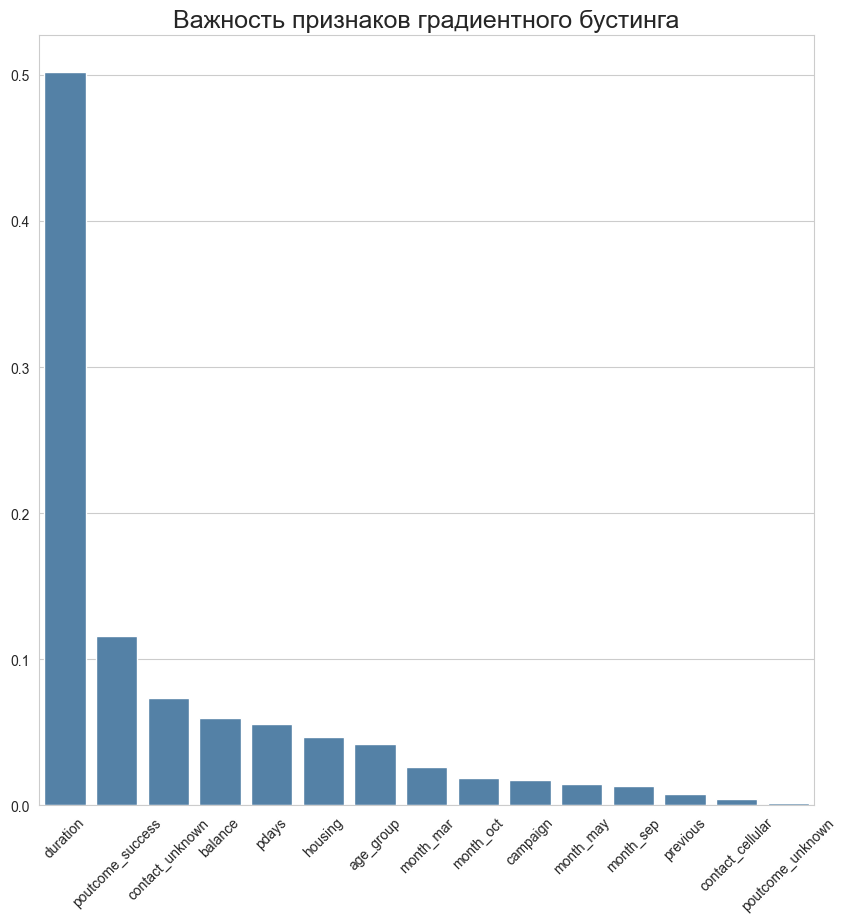

In [144]:
# оцените, какие признаки демонстрируют наибольшую  важность в модели градиентного бустинга
idx = np.argsort(gb.feature_importances_)[::-1]
sns.barplot(x=gb.feature_names_in_[idx],y=gb.feature_importances_[idx],color='steelblue')
plt.xticks(rotation=45)
plt.title('Важность признаков градиентного бустинга',fontsize=18)
plt.show()

### Задания 6,7,8

Настроим оптимизацию гиперпараметров для алгоритма случайного леса.

In [145]:
# реализуйте оптимизацию гиперпараметров с помощью Optuna
import optuna

def optuna_rf(trial):
  # задаем пространства поиска гиперпараметров
  n_estimators = trial.suggest_int('n_estimators', 100, 300, 10)
  max_depth = trial.suggest_int('max_depth', 15, 40, 1)
  min_samples_leaf = trial.suggest_int('min_samples_leaf', 3, 7, 1)

  # создаем модель
  model = ensemble.RandomForestClassifier(n_estimators=n_estimators,
                                          max_depth=max_depth,
                                          min_samples_leaf=min_samples_leaf,
                                          random_state=42)
  # обучаем модель
  model.fit(X_train_scal, y_train)
  score = metrics.f1_score(y_train, model.predict(X_train_scal))

  return score

In [85]:
# cоздаем объект исследования
study = optuna.create_study(study_name="RandomForestClassifier",direction='maximize')
# ищем лучшую комбинацию гиперпараметров n_trials раз
study.optimize(optuna_rf, n_trials=50)



[I 2024-05-17 11:53:18,828] A new study created in memory with name: RandomForestClassifier
[I 2024-05-17 11:53:20,675] Trial 0 finished with value: 0.8585244111683045 and parameters: {'n_estimators': 280, 'max_depth': 28, 'min_samples_leaf': 7}. Best is trial 0 with value: 0.8585244111683045.
[I 2024-05-17 11:53:22,532] Trial 1 finished with value: 0.87743950039032 and parameters: {'n_estimators': 250, 'max_depth': 31, 'min_samples_leaf': 4}. Best is trial 1 with value: 0.87743950039032.
[I 2024-05-17 11:53:24,613] Trial 2 finished with value: 0.8609809434551702 and parameters: {'n_estimators': 300, 'max_depth': 18, 'min_samples_leaf': 6}. Best is trial 1 with value: 0.87743950039032.
[I 2024-05-17 11:53:25,727] Trial 3 finished with value: 0.8930188973918476 and parameters: {'n_estimators': 140, 'max_depth': 30, 'min_samples_leaf': 3}. Best is trial 3 with value: 0.8930188973918476.
[I 2024-05-17 11:53:27,635] Trial 4 finished with value: 0.8585244111683045 and parameters: {'n_estima

In [86]:
# выводим результаты на обучающей выборке
print("Наилучшие значения гиперпараметров {}".format(study.best_params))
print("f1_score на обучающем наборе: {:.2f}".format(study.best_value))

Наилучшие значения гиперпараметров {'n_estimators': 260, 'max_depth': 38, 'min_samples_leaf': 3}
f1_score на обучающем наборе: 0.90


In [87]:
# рассчитаем точность для тестовой выборки
model = ensemble.RandomForestClassifier(**study.best_params,random_state=42)
model.fit(X_train_scal, y_train)
y_train_pred = model.predict(X_train_scal)
print('f1_score на тренировочном наборе: {:.2f}'.format(metrics.f1_score(y_train, y_train_pred)))
print('Accuracy на тренировочном наборе: {:.2f}'.format(metrics.accuracy_score(y_train, y_train_pred)))
y_test_pred = model.predict(X_test_scal)
print('f1_score на тестовом наборе: {:.2f}'.format(metrics.f1_score(y_test, y_test_pred)))
print('Accuracy на тестовом наборе: {:.2f}'.format(metrics.accuracy_score(y_test, y_test_pred)))

f1_score на тренировочном наборе: 0.90
Accuracy на тренировочном наборе: 0.90
f1_score на тестовом наборе: 0.82
Accuracy на тестовом наборе: 0.83


# Итоги 

Для решения задачи наилучшим образом себя показали модели машинного обучения, такие как случайный лес, градиентный бустинг, случайный лес с методом подбора геперпараметров Optune, метрика accuracy_score которых составляет 0.83. Использование стэкинга привело к переобучению модели.

Наиболее важными параметрами влияющими на открытие депозита оказались: duration(продолжительность разговора),poutcome_success(успешный результат предыдущей рекламной компании),contact_unknown(неизвестный тип контаткта).

Чуть менее важными признаками оказались месяц в котором был последний контакт, баланс клиента, месяц, в котором был последний контакт (в марте и октябре успешные результаты),а также имеется ли кредит на жилье.